In [1]:
import os
import warnings
import sys

import pandas as pd
from tqdm.auto import tqdm
from transformers import (
    AutoTokenizer,
)
import datasets

sys.path.append("../")
from utils import seed_everything, canonicalize, space_clean, get_accuracy_score, preprocess_dataset

# Suppress warnings and disable progress bars
warnings.filterwarnings("ignore")
datasets.utils.logging.disable_progress_bar()

from rdkit import Chem
from rdkit.Chem import Descriptors

class CFG:
    model_name_or_path = '/groups/gca50095/sagawa/ReactionT5_neword/forward_reaction_prediction_drop_dup/finetuning_lr2e-5_20epoch_maxinput200/t5/checkpoint-102264'
    seed = 42
    

device = 'cpu'


seed_everything(seed=CFG.seed)  

tokenizer = AutoTokenizer.from_pretrained(CFG.model_name_or_path, return_tensors='pt')
tokenizer.add_special_tokens(
    {
        "additional_special_tokens": tokenizer.additional_special_tokens
        + ["REACTANT:", "REAGENT:", "YIELD:"]
    }
)

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


1

In [9]:
def calculate_molecular_weight(smiles):
    molecule = Chem.MolFromSmiles(smiles)
    molecular_weight = Descriptors.MolWt(molecule)
    
    return molecular_weight

def calculate_token_length(text, tokenizer):
    return len(tokenizer(text).input_ids)

In [25]:
def preprocess_df_FORWARD(df):
    for col in ["REACTANT", "REAGENT"]:
        df[col] = df[col].fillna(" ")
        df[col] = df[col].str.replace("\n", "")
    df["input"] = (
        "REACTANT:" + df["REACTANT"] + "REAGENT:" + df["REAGENT"]
    )

    return df


def preprocess_df_RETROSYNTHESIS(df):
    for col in ["REACTANT", "PRODUCT"]:
        df[col] = df[col].fillna(" ")
        df[col] = df[col].str.replace("\n", "")
    df["input"] = df["PRODUCT"]
    df.rename(columns={"REACTANT": "target"}, inplace=True)

    return df


def preprocess_df_YIELD(df):
    for col in ["REACTANT", "REAGENT", "PRODUCT"]:
        df[col] = df[col].fillna(" ")
        df[col] = df[col].str.replace("\n", "")
    if max(df["YIELD"]) > 1:
        df["YIELD"] = df["YIELD"] / 100
    df["YIELD"] = df["YIELD"].apply(lambda x: round(x * 10) / 10)
    # convert YIELD value 0.1 to 10%, 0.2 to 20%, ..., 1.0 to 100%
    df["YIELD"] = df["YIELD"].apply(lambda x: str(int(x * 100)) + "%")

    df["input"] = (
        "REACTANT:"
        + df["REACTANT"]
        + "REAGENT:"
        + df["REAGENT"]
        + "PRODUCT:"
        + df["PRODUCT"]
    )
    df.rename(columns={"YIELD": "target"}, inplace=True)

    return df

USPTO_MIT

In [11]:
import pandas as pd
train = pd.read_csv("/home/acf15718oa/ReactionT5_neword/data/USPTO_MIT/MIT_separated/train.csv")
val = pd.read_csv("/home/acf15718oa/ReactionT5_neword/data/USPTO_MIT/MIT_separated/val.csv")
test = pd.read_csv("/home/acf15718oa/ReactionT5_neword/data/USPTO_MIT/MIT_separated/test.csv")

df = pd.concat([train, val, test]).reset_index(drop=True)
df = preprocess_df_FORWARD(df)
df

,REACTANT,REAGENT,target,Unnamed: 0,input
0,CC(C)C[Mg+].CON(C)C(=O)c1ccc(O)nc1,C1CCOC1.[Cl-],CC(C)CC(=O)c1ccc(O)nc1,NaN,REACTANT:CC(C)C[Mg+].CON(C)C(=O)c1ccc(O)nc1REA...
1,CN.O=C(O)c1ccc(Cl)c([N+](=O)[O-])c1,O,CNc1ccc(C(=O)O)cc1[N+](=O)[O-],NaN,REACTANT:CN.O=C(O)c1ccc(Cl)c([N+](=O)[O-])c1RE...
2,CCn1cc(C(=O)O)c(=O)c2cc(F)c(-c3ccc(N)cc3)cc21....,,CCn1cc(C(=O)O)c(=O)c2cc(F)c(-c3ccc(NC=O)cc3)cc21,NaN,REACTANT:CCn1cc(C(=O)O)c(=O)c2cc(F)c(-c3ccc(N)...
3,COCC(C)Oc1cc(Oc2cnc(C(=O)N3CCC3)cn2)cc(C(=O)O)...,CC(C)=C(Cl)N(C)C.ClCCl.c1ccncc1,COCC(C)Oc1cc(Oc2cnc(C(=O)N3CCC3)cn2)cc(C(=O)Nc...,NaN,REACTANT:COCC(C)Oc1cc(Oc2cnc(C(=O)N3CCC3)cn2)c...
4,Clc1cc2c(Cl)nc(-c3ccncc3)nc2s1.NCc1ccc(Cl)c(Cl)c1,,Clc1cc2c(NCc3ccc(Cl)c(Cl)c3)nc(-c3ccncc3)nc2s1,NaN,REACTANT:Clc1cc2c(Cl)nc(-c3ccncc3)nc2s1.NCc1cc...
...,...,...,...,...,...
479030,COC(=O)NCC1Cc2c(Cl)cc3c(c2O1)CCC3,[Al+3].[H-].[H-].[H-].[H-].[Li+],CNCC1Cc2c(Cl)cc3c(c2O1)CCC3,39995.0,REACTANT:COC(=O)NCC1Cc2c(Cl)cc3c(c2O1)CCC3REAG...
479031,COc1cccc(C(=O)Cl)c1.COc1ccccc1OC,COc1ccc(C(=CC#N)c2ccc(OC)c(OC)c2)cc1.ClCCl.[Al...,COc1cccc(C(=O)c2ccc(OC)c(OC)c2)c1,39996.0,REACTANT:COc1cccc(C(=O)Cl)c1.COc1ccccc1OCREAGE...
479032,C#Cc1cccc(C2C(C(=O)OC)=C(C)NC(C(OC)OC)=C2C(=O)...,CC(C)=O.Cl,C#Cc1cccc(C2C(C(=O)OC)=C(C)NC(C=O)=C2C(=O)OC)c1,39997.0,REACTANT:C#Cc1cccc(C2C(C(=O)OC)=C(C)NC(C(OC)OC...
479033,CO.COc1ccc(CC(=O)c2ccc(O)cc2O)cc1,,COc1ccc(CC(=O)c2ccc(OC)cc2O)cc1,39998.0,REACTANT:CO.COc1ccc(CC(=O)c2ccc(O)cc2O)cc1REAG...


In [13]:
df["length"] = df["input"].apply(lambda x: calculate_token_length(x, tokenizer))
df["length"].describe()

count    479035.000000
mean         66.071707
std          29.075061
min           7.000000
25%          47.000000
50%          61.000000
75%          78.000000
max         289.000000
Name: length, dtype: float64

In [16]:
df["input"] = df["input"].apply(lambda x: x.replace("REACTANT:", "").replace("REAGENT:", ".").replace(" ", "").rstrip("."))
df

,REACTANT,REAGENT,target,Unnamed: 0,input,length
0,CC(C)C[Mg+].CON(C)C(=O)c1ccc(O)nc1,C1CCOC1.[Cl-],CC(C)CC(=O)c1ccc(O)nc1,NaN,CC(C)C[Mg+].CON(C)C(=O)c1ccc(O)nc1.C1CCOC1.[Cl-],44
1,CN.O=C(O)c1ccc(Cl)c([N+](=O)[O-])c1,O,CNc1ccc(C(=O)O)cc1[N+](=O)[O-],NaN,CN.O=C(O)c1ccc(Cl)c([N+](=O)[O-])c1.O,36
2,CCn1cc(C(=O)O)c(=O)c2cc(F)c(-c3ccc(N)cc3)cc21....,,CCn1cc(C(=O)O)c(=O)c2cc(F)c(-c3ccc(NC=O)cc3)cc21,NaN,CCn1cc(C(=O)O)c(=O)c2cc(F)c(-c3ccc(N)cc3)cc21....,51
3,COCC(C)Oc1cc(Oc2cnc(C(=O)N3CCC3)cn2)cc(C(=O)O)...,CC(C)=C(Cl)N(C)C.ClCCl.c1ccncc1,COCC(C)Oc1cc(Oc2cnc(C(=O)N3CCC3)cn2)cc(C(=O)Nc...,NaN,COCC(C)Oc1cc(Oc2cnc(C(=O)N3CCC3)cn2)cc(C(=O)O)...,85
4,Clc1cc2c(Cl)nc(-c3ccncc3)nc2s1.NCc1ccc(Cl)c(Cl)c1,,Clc1cc2c(NCc3ccc(Cl)c(Cl)c3)nc(-c3ccncc3)nc2s1,NaN,Clc1cc2c(Cl)nc(-c3ccncc3)nc2s1.NCc1ccc(Cl)c(Cl)c1,47
...,...,...,...,...,...,...
479030,COC(=O)NCC1Cc2c(Cl)cc3c(c2O1)CCC3,[Al+3].[H-].[H-].[H-].[H-].[Li+],CNCC1Cc2c(Cl)cc3c(c2O1)CCC3,39995.0,COC(=O)NCC1Cc2c(Cl)cc3c(c2O1)CCC3.[Al+3].[H-]....,70
479031,COc1cccc(C(=O)Cl)c1.COc1ccccc1OC,COc1ccc(C(=CC#N)c2ccc(OC)c(OC)c2)cc1.ClCCl.[Al...,COc1cccc(C(=O)c2ccc(OC)c(OC)c2)c1,39996.0,COc1cccc(C(=O)Cl)c1.COc1ccccc1OC.COc1ccc(C(=CC...,91
479032,C#Cc1cccc(C2C(C(=O)OC)=C(C)NC(C(OC)OC)=C2C(=O)...,CC(C)=O.Cl,C#Cc1cccc(C2C(C(=O)OC)=C(C)NC(C=O)=C2C(=O)OC)c1,39997.0,C#Cc1cccc(C2C(C(=O)OC)=C(C)NC(C(OC)OC)=C2C(=O)...,59
479033,CO.COc1ccc(CC(=O)c2ccc(O)cc2O)cc1,,COc1ccc(CC(=O)c2ccc(OC)cc2O)cc1,39998.0,CO.COc1ccc(CC(=O)c2ccc(O)cc2O)cc1,31


In [17]:
df["weight"] = df["input"].apply(lambda x: calculate_molecular_weight(x))
df["weight"].describe()

[16:04:24] WARNING: not removing hydrogen atom without neighbors
[16:04:24] WARNING: not removing hydrogen atom without neighbors
[16:04:24] WARNING: not removing hydrogen atom without neighbors
[16:04:24] WARNING: not removing hydrogen atom without neighbors
[16:04:24] WARNING: not removing hydrogen atom without neighbors
[16:04:24] WARNING: not removing hydrogen atom without neighbors
[16:04:24] WARNING: not removing hydrogen atom without neighbors
[16:04:24] WARNING: not removing hydrogen atom without neighbors
[16:04:24] WARNING: not removing hydrogen atom without neighbors
[16:04:24] WARNING: not removing hydrogen atom without neighbors
[16:04:24] WARNING: not removing hydrogen atom without neighbors
[16:04:24] WARNING: not removing hydrogen atom without neighbors
[16:04:24] WARNING: not removing hydrogen atom without neighbors
[16:04:24] WARNING: not removing hydrogen atom without neighbors
[16:04:24] WARNING: not removing hydrogen atom without neighbors
[16:04:24] WARNING: not r

count    479035.000000
mean        632.302293
std         292.996451
min         119.167000
25%         448.672000
50%         572.473000
75%         736.009000
max        2761.607000
Name: weight, dtype: float64

In [18]:
df["weight"].describe()

count    479035.000000
mean        632.302293
std         292.996451
min         119.167000
25%         448.672000
50%         572.473000
75%         736.009000
max        2761.607000
Name: weight, dtype: float64

USPTO_50k

In [19]:
import pandas as pd
train = pd.read_csv("/home/acf15718oa/ReactionT5_neword/data/USPTO_50k/train.csv")
val = pd.read_csv("/home/acf15718oa/ReactionT5_neword/data/USPTO_50k/val.csv")
test = pd.read_csv("/home/acf15718oa/ReactionT5_neword/data/USPTO_50k/test.csv")

df = pd.concat([train, val, test]).reset_index(drop=True)
df = preprocess_df_RETROSYNTHESIS(df)
df

,target,PRODUCT,input
0,CS(=O)(=O)OC[C@H]1CCC(=O)O1.Fc1ccc(Nc2ncnc3cc(...,O=C1CC[C@H](CN2CCN(CCOc3cc4ncnc(Nc5ccc(F)c(Cl)...,O=C1CC[C@H](CN2CCN(CCOc3cc4ncnc(Nc5ccc(F)c(Cl)...
1,COC(=O)c1cc(CCCc2cc3c(=O)[nH]c(N)nc3[nH]2)cs1,Nc1nc2[nH]c(CCCc3csc(C(=O)O)c3)cc2c(=O)[nH]1,Nc1nc2[nH]c(CCCc3csc(C(=O)O)c3)cc2c(=O)[nH]1
2,CC1(C)OB(B2OC(C)(C)C(C)(C)O2)OC1(C)C.FC(F)(F)c...,CC1(C)OB(c2cccc(Nc3nccc(C(F)(F)F)n3)c2)OC1(C)C,CC1(C)OB(c2cccc(Nc3nccc(C(F)(F)F)n3)c2)OC1(C)C
3,CC(C)(C)OC(=O)NCC(=O)CCC(=O)OCCCC(=O)OCc1ccccc1,CC(C)(C)OC(=O)NCC(=O)CCC(=O)OCCCC(=O)O,CC(C)(C)OC(=O)NCC(=O)CCC(=O)OCCCC(=O)O
4,Fc1cc2c(Cl)ncnc2cn1.NC1CCCCCC1,Fc1cc2c(NC3CCCCCC3)ncnc2cn1,Fc1cc2c(NC3CCCCCC3)ncnc2cn1
...,...,...,...
50032,Cc1cc([N+](=O)[O-])ccc1O.Nc1cc(Cl)ccn1,Cc1cc([N+](=O)[O-])ccc1Oc1ccnc(N)c1,Cc1cc([N+](=O)[O-])ccc1Oc1ccnc(N)c1
50033,COC(=O)c1[nH]c2cc(Cl)cc3c2c1C(CC(=O)OC(C)(C)C)CC3,COC(=O)c1[nH]c2cc(Cl)cc3c2c1C(CC(=O)O)CC3,COC(=O)c1[nH]c2cc(Cl)cc3c2c1C(CC(=O)O)CC3
50034,COc1cc(C(F)(F)F)cc(SC)c1C(=O)NC1(c2ccccc2)CC(=...,COc1cc(C(F)(F)F)cc(SC)c1C(=O)NC1(c2ccccc2)CC(O...,COc1cc(C(F)(F)F)cc(SC)c1C(=O)NC1(c2ccccc2)CC(O...
50035,C=C(C)Cn1nc(C)c(Br)c1-c1ccc(F)cc1.OO,Cc1nn(CC(C)CO)c(-c2ccc(F)cc2)c1Br,Cc1nn(CC(C)CO)c(-c2ccc(F)cc2)c1Br


In [20]:
df["length"] = df["input"].apply(lambda x: calculate_token_length(x, tokenizer))
df["length"].describe()

count    50037.000000
mean        40.164478
std         16.997959
min          2.000000
25%         28.000000
50%         39.000000
75%         50.000000
max        197.000000
Name: length, dtype: float64

In [21]:
df["weight"] = df["input"].apply(lambda x: calculate_molecular_weight(x))

In [22]:
df["weight"].describe()

count    50037.000000
mean       371.550682
std        130.826667
min         44.053000
25%        273.159000
50%        364.430000
75%        455.584000
max       1300.563000
Name: weight, dtype: float64

C_N

In [30]:
train = pd.read_csv("/home/acf15718oa/ReactionT5_neword/data/C_N_yield/MFF_Test1/train.csv")
test = pd.read_csv("/home/acf15718oa/ReactionT5_neword/data/C_N_yield/MFF_Test1/test.csv")

df = pd.concat([train, test]).reset_index(drop=True)
df = preprocess_df_YIELD(df)
df

,REACTANT,REAGENT,PRODUCT,target,input
0,FC(F)(F)c1ccc(Cl)cc1.Cc1ccc(N)cc1,CC(C)c1cc(C(C)C)c(-c2ccccc2P(C2CCCCC2)(C2CCCCC...,Cc1ccc(Nc2ccc(C(F)(F)F)cc2)cc1,0%,REACTANT:FC(F)(F)c1ccc(Cl)cc1.Cc1ccc(N)cc1REAG...
1,FC(F)(F)c1ccc(Br)cc1.Cc1ccc(N)cc1,CC(C)c1cc(C(C)C)c(-c2ccccc2P(C2CCCCC2)(C2CCCCC...,Cc1ccc(Nc2ccc(C(F)(F)F)cc2)cc1,40%,REACTANT:FC(F)(F)c1ccc(Br)cc1.Cc1ccc(N)cc1REAG...
2,FC(F)(F)c1ccc(I)cc1.Cc1ccc(N)cc1,CC(C)c1cc(C(C)C)c(-c2ccccc2P(C2CCCCC2)(C2CCCCC...,Cc1ccc(Nc2ccc(C(F)(F)F)cc2)cc1,40%,REACTANT:FC(F)(F)c1ccc(I)cc1.Cc1ccc(N)cc1REAGE...
3,COc1ccc(Cl)cc1.Cc1ccc(N)cc1,CC(C)c1cc(C(C)C)c(-c2ccccc2P(C2CCCCC2)(C2CCCCC...,COc1ccc(Nc2ccc(C)cc2)cc1,0%,REACTANT:COc1ccc(Cl)cc1.Cc1ccc(N)cc1REAGENT:CC...
4,COc1ccc(Br)cc1.Cc1ccc(N)cc1,CC(C)c1cc(C(C)C)c(-c2ccccc2P(C2CCCCC2)(C2CCCCC...,COc1ccc(Nc2ccc(C)cc2)cc1,30%,REACTANT:COc1ccc(Br)cc1.Cc1ccc(N)cc1REAGENT:CC...
...,...,...,...,...,...
3950,Brc1ccccn1.Cc1ccc(N)cc1,COc1ccc(OC)c(P(C23CC4CC(CC(C4)C2)C3)(C23CC4CC(...,Cc1ccc(Nc2ccccn2)cc1,60%,REACTANT:Brc1ccccn1.Cc1ccc(N)cc1REAGENT:COc1cc...
3951,Ic1ccccn1.Cc1ccc(N)cc1,COc1ccc(OC)c(P(C23CC4CC(CC(C4)C2)C3)(C23CC4CC(...,Cc1ccc(Nc2ccccn2)cc1,90%,REACTANT:Ic1ccccn1.Cc1ccc(N)cc1REAGENT:COc1ccc...
3952,Clc1cccnc1.Cc1ccc(N)cc1,COc1ccc(OC)c(P(C23CC4CC(CC(C4)C2)C3)(C23CC4CC(...,Cc1ccc(Nc2cccnc2)cc1,0%,REACTANT:Clc1cccnc1.Cc1ccc(N)cc1REAGENT:COc1cc...
3953,Brc1cccnc1.Cc1ccc(N)cc1,COc1ccc(OC)c(P(C23CC4CC(CC(C4)C2)C3)(C23CC4CC(...,Cc1ccc(Nc2cccnc2)cc1,40%,REACTANT:Brc1cccnc1.Cc1ccc(N)cc1REAGENT:COc1cc...


In [31]:
df["length"] = df["input"].apply(lambda x: calculate_token_length(x, tokenizer))
df["length"].describe()

count    3955.000000
mean      206.523894
std        21.644285
min       160.000000
25%       190.000000
50%       206.000000
75%       221.000000
max       272.000000
Name: length, dtype: float64

In [32]:
df["input"] = df["input"].apply(lambda x: x.replace("REACTANT:", "").replace("REAGENT:", ".").replace("PRODUCT:", ".").replace(" ", "").replace("..", ".").rstrip("."))
df

,REACTANT,REAGENT,PRODUCT,target,input,length
0,FC(F)(F)c1ccc(Cl)cc1.Cc1ccc(N)cc1,CC(C)c1cc(C(C)C)c(-c2ccccc2P(C2CCCCC2)(C2CCCCC...,Cc1ccc(Nc2ccc(C(F)(F)F)cc2)cc1,0%,FC(F)(F)c1ccc(Cl)cc1.Cc1ccc(N)cc1.CC(C)c1cc(C(...,222
1,FC(F)(F)c1ccc(Br)cc1.Cc1ccc(N)cc1,CC(C)c1cc(C(C)C)c(-c2ccccc2P(C2CCCCC2)(C2CCCCC...,Cc1ccc(Nc2ccc(C(F)(F)F)cc2)cc1,40%,FC(F)(F)c1ccc(Br)cc1.Cc1ccc(N)cc1.CC(C)c1cc(C(...,221
2,FC(F)(F)c1ccc(I)cc1.Cc1ccc(N)cc1,CC(C)c1cc(C(C)C)c(-c2ccccc2P(C2CCCCC2)(C2CCCCC...,Cc1ccc(Nc2ccc(C(F)(F)F)cc2)cc1,40%,FC(F)(F)c1ccc(I)cc1.Cc1ccc(N)cc1.CC(C)c1cc(C(C...,221
3,COc1ccc(Cl)cc1.Cc1ccc(N)cc1,CC(C)c1cc(C(C)C)c(-c2ccccc2P(C2CCCCC2)(C2CCCCC...,COc1ccc(Nc2ccc(C)cc2)cc1,0%,COc1ccc(Cl)cc1.Cc1ccc(N)cc1.CC(C)c1cc(C(C)C)c(...,209
4,COc1ccc(Br)cc1.Cc1ccc(N)cc1,CC(C)c1cc(C(C)C)c(-c2ccccc2P(C2CCCCC2)(C2CCCCC...,COc1ccc(Nc2ccc(C)cc2)cc1,30%,COc1ccc(Br)cc1.Cc1ccc(N)cc1.CC(C)c1cc(C(C)C)c(...,208
...,...,...,...,...,...,...
3950,Brc1ccccn1.Cc1ccc(N)cc1,COc1ccc(OC)c(P(C23CC4CC(CC(C4)C2)C3)(C23CC4CC(...,Cc1ccc(Nc2ccccn2)cc1,60%,Brc1ccccn1.Cc1ccc(N)cc1.COc1ccc(OC)c(P(C23CC4C...,213
3951,Ic1ccccn1.Cc1ccc(N)cc1,COc1ccc(OC)c(P(C23CC4CC(CC(C4)C2)C3)(C23CC4CC(...,Cc1ccc(Nc2ccccn2)cc1,90%,Ic1ccccn1.Cc1ccc(N)cc1.COc1ccc(OC)c(P(C23CC4CC...,213
3952,Clc1cccnc1.Cc1ccc(N)cc1,COc1ccc(OC)c(P(C23CC4CC(CC(C4)C2)C3)(C23CC4CC(...,Cc1ccc(Nc2cccnc2)cc1,0%,Clc1cccnc1.Cc1ccc(N)cc1.COc1ccc(OC)c(P(C23CC4C...,213
3953,Brc1cccnc1.Cc1ccc(N)cc1,COc1ccc(OC)c(P(C23CC4CC(CC(C4)C2)C3)(C23CC4CC(...,Cc1ccc(Nc2cccnc2)cc1,40%,Brc1cccnc1.Cc1ccc(N)cc1.COc1ccc(OC)c(P(C23CC4C...,213


In [33]:
df["weight"] = df["input"].apply(lambda x: calculate_molecular_weight(x))

In [34]:
df["weight"].describe()

count    3955.000000
mean     1884.229899
std       139.731811
min      1567.761000
25%      1776.011000
50%      1874.206000
75%      1976.637000
max      2376.928000
Name: weight, dtype: float64

ORD_v2 forward

In [2]:
def preprocess_df_FORWARD(df):
    """Preprocess the dataframe by filling NaNs, dropping duplicates, and formatting the input."""
    df = df[~(df["PRODUCT"].isna() | df["REACTANT"].isna())]
    for col in ["CATALYST", "REAGENT", "SOLVENT"]:
        df[col] = df[col].fillna(" ")
    df = (
        df[["REACTANT", "PRODUCT", "CATALYST", "REAGENT", "SOLVENT"]]
        .drop_duplicates()
        .reset_index(drop=True)
    )
    df["REAGENT"] = df["CATALYST"] + "." + df["REAGENT"] + "." + df["SOLVENT"]
    df["REAGENT"] = df["REAGENT"].apply(lambda x: space_clean(x))
    df["REAGENT"] = df["REAGENT"].apply(lambda x: canonicalize(x) if x != " " else " ")
    df["input"] = "REACTANT:" + df["REACTANT"] + "REAGENT:" + df["REAGENT"]
    return df


def preprocess_df_RETROSYNTHESIS(df):
    """Preprocess the dataframe by filling NaNs, dropping duplicates, and formatting the input."""
    df = df[~(df["PRODUCT"].isna() | df["REACTANT"].isna())]
    for col in ["CATALYST", "REAGENT", "SOLVENT"]:
        df[col] = df[col].fillna(" ")
    df = (
        df[["REACTANT", "PRODUCT", "CATALYST", "REAGENT", "SOLVENT"]]
        .drop_duplicates()
        .reset_index(drop=True)
    )
    df["input"] = df["PRODUCT"]

    return df


def preprocess_df_YIELD(df):
    """
    Preprocess the input DataFrame for training.

    Args:
        df (pd.DataFrame): Input DataFrame.
        cfg (argparse.Namespace): Configuration object.

    Returns:
        pd.DataFrame: Preprocessed DataFrame.
    """
    df = df[~(df["YIELD"].isna() | df["REACTANT"].isna() | df["PRODUCT"].isna())].reset_index(drop=True)
    df["YIELD"] = df["YIELD"].apply(lambda x: 100 if x > 100 else x) / 100

    for col in [
        "CATALYST",
        "REAGENT",
    ]:
        df[col] = df[col].fillna(" ")

    df["REAGENT"] = df["CATALYST"] + "." + df["REAGENT"]
    df["REAGENT"] = df["REAGENT"].apply(lambda x: space_clean(x))
    df["REAGENT"] = df["REAGENT"].apply(lambda x: canonicalize(x) if x != " " else " ")

    df["input"] = (
        "REACTANT:"
        + df["REACTANT"]
        + "REAGENT:"
        + df["REAGENT"]
        + "PRODUCT:"
        + df["PRODUCT"]
    )
    df = df.loc[df[["input", "YIELD"]].drop_duplicates().index].reset_index(drop=True)

    return df

In [41]:
train = pd.read_csv("/home/acf15718oa/ReactionT5_neword/data/all_ord_reaction_uniq_with_attr20240506_v3_train.csv")
val = pd.read_csv("/home/acf15718oa/ReactionT5_neword/data/all_ord_reaction_uniq_with_attr20240506_v3_valid.csv")
test = pd.read_csv("/home/acf15718oa/ReactionT5_neword/data/all_ord_reaction_uniq_with_attr20240506_v3_test.csv")

df = pd.concat([train, val, test]).reset_index(drop=True)
df = preprocess_df_FORWARD(df)
df

[17:18:25] WARNING: not removing hydrogen atom without neighbors
[17:18:25] WARNING: not removing hydrogen atom without neighbors
[17:18:26] WARNING: not removing hydrogen atom without neighbors
[17:18:26] WARNING: not removing hydrogen atom without neighbors
[17:18:27] WARNING: not removing hydrogen atom without neighbors
[17:18:27] WARNING: not removing hydrogen atom without neighbors
[17:18:27] WARNING: not removing hydrogen atom without neighbors
[17:18:27] WARNING: not removing hydrogen atom without neighbors
[17:18:27] WARNING: not removing hydrogen atom without neighbors
[17:18:27] WARNING: not removing hydrogen atom without neighbors
[17:18:28] WARNING: not removing hydrogen atom without neighbors
[17:18:28] WARNING: not removing hydrogen atom without neighbors
[17:18:28] WARNING: not removing hydrogen atom without neighbors
[17:18:28] WARNING: not removing hydrogen atom without neighbors
[17:18:28] WARNING: not removing hydrogen atom without neighbors
[17:18:28] WARNING: not r

,REACTANT,PRODUCT,CATALYST,REAGENT,SOLVENT,input
0,C(=NC1CCCCC1)=NC1CCCCC1.CC(C)(C)OC(=O)CO/N=C(\...,CC(C)(C)OC(=O)CO/N=C(\C(=O)N[C@@H]1C(=O)N2C(C(...,,CC(=O)N(C)C.CC(=O)N(C)C.O,CC(=O)N(C)C.CC(=O)N(C)C.O,REACTANT:C(=NC1CCCCC1)=NC1CCCCC1.CC(C)(C)OC(=O...
1,CC(C)OC(=O)N=NC(=O)OC(C)C.CCCCC[C@H](O)c1ccc(C...,CCCCC[C@@H](OC(=O)c1ccc([N+](=O)[O-])cc1)c1ccc...,,C1CCOC1,C1CCOC1,REACTANT:CC(C)OC(=O)N=NC(=O)OC(C)C.CCCCC[C@H](...
2,CC(CN1CCCC1)N1c2ccccc2Sc2ccc(C(N)=S)cc21.CCOC(...,CC(CN1CCCC1)N1c2ccccc2Sc2ccc(C3=NC4CCCCC4N3)cc21,,,,REACTANT:CC(CN1CCCC1)N1c2ccccc2Sc2ccc(C(N)=S)c...
3,CC(C)(C)OC(=O)N(C(=O)[C@@H]1C[C@H](F)CN1)C(C)(...,CC(C)(C)NC(=O)[C@@H]1C[C@H](F)CN1C(=O)[C@@H](O...,,,,REACTANT:CC(C)(C)OC(=O)N(C(=O)[C@@H]1C[C@H](F)...
4,CCC=CCCc1cc(Cl)cc(C(=O)OC)c1O,COC(=O)c1cc(Cl)cc2c1O[C@@H]1CCCC[C@@H]21,,O=C(O)C(F)(F)F,O=C(O)C(F)(F)F,REACTANT:CCC=CCCc1cc(Cl)cc(C(=O)OC)c1OREAGENT:...
...,...,...,...,...,...,...
1491288,CC(C)OC(=O)N1CCC(COc2ccc(Br)nc2)CC1.COCCOC.Cl[...,CC(C)OC(=O)N1CCC(COc2ccc(-c3ccc(S(=O)(=O)NCCO)...,,,,REACTANT:CC(C)OC(=O)N1CCC(COc2ccc(Br)nc2)CC1.C...
1491289,C1CC(N2CCCNCC2)C1.C=Cc1ccc(C=C)cc1.C=Cc1ccccc1...,Cl.N#Cc1ccc(-c2ccc(C(=O)N3CCCN(C4CCC4)CC3)cc2)cc1,,ClCCCl.ClCCl,ClCCCl.ClCCl,REACTANT:C1CC(N2CCCNCC2)C1.C=Cc1ccc(C=C)cc1.C=...
1491290,CC(C)(C)OC(=O)Nc1cncc(C(=O)N2CCC(c3cccc(CN(C(=...,CC(C)(C)OC(=O)N(Cc1cccc(C2CCN(C(=O)c3cncc(N(Cc...,,,,REACTANT:CC(C)(C)OC(=O)Nc1cncc(C(=O)N2CCC(c3cc...
1491291,B.CSC.O=C(O)COCCc1ccc(Br)cc1,OCCOCCc1ccc(Br)cc1,,C1CCOC1,C1CCOC1,REACTANT:B.CSC.O=C(O)COCCc1ccc(Br)cc1REAGENT:C...


In [43]:
df["length"] = df["input"].apply(lambda x: calculate_token_length(x, tokenizer))
df["length"].describe()

count    1.491293e+06
mean     7.611038e+01
std      4.088982e+01
min      6.000000e+00
25%      5.100000e+01
50%      6.700000e+01
75%      8.900000e+01
max      2.219000e+03
Name: length, dtype: float64

In [44]:
df["input"] = df["input"].apply(lambda x: x.replace("REACTANT:", "").replace("REAGENT:", ".").replace(" ", "").rstrip("."))
df["weight"] = df["input"].apply(lambda x: calculate_molecular_weight(x))

[17:27:27] WARNING: not removing hydrogen atom without neighbors
[17:27:27] WARNING: not removing hydrogen atom without neighbors
[17:27:27] WARNING: not removing hydrogen atom without neighbors
[17:27:27] WARNING: not removing hydrogen atom without neighbors
[17:27:27] WARNING: not removing hydrogen atom without neighbors
[17:27:27] WARNING: not removing hydrogen atom without neighbors
[17:27:27] WARNING: not removing hydrogen atom without neighbors
[17:27:27] WARNING: not removing hydrogen atom without neighbors
[17:27:27] WARNING: not removing hydrogen atom without neighbors
[17:27:27] WARNING: not removing hydrogen atom without neighbors
[17:27:27] WARNING: not removing hydrogen atom without neighbors
[17:27:27] WARNING: not removing hydrogen atom without neighbors
[17:27:27] WARNING: not removing hydrogen atom without neighbors
[17:27:27] WARNING: not removing hydrogen atom without neighbors
[17:27:27] WARNING: not removing hydrogen atom without neighbors
[17:27:27] WARNING: not r

In [45]:
df["weight"].describe()

count    1.491293e+06
mean     7.085319e+02
std      3.797113e+02
min      3.779400e+01
25%      4.760100e+02
50%      6.156210e+02
75%      8.162890e+02
max      1.358887e+04
Name: weight, dtype: float64

In [6]:
test = pd.read_csv("/home/acf15718oa/ReactionT5_neword/data/all_ord_reaction_uniq_with_attr20240506_v3_test.csv")[:10]
test = preprocess_df_RETROSYNTHESIS(test)
test[["input", "REACTANT"]].to_csv("/home/acf15718oa/ReactionT5_neword/data/task_retrosynthesis_demo_input.csv", index=False)

In [5]:
test[["input", "REACTANT"]]

,input,REACTANT
0,CCN(CC)CCNC(=S)NC1CCCc2cc(C)cnc21,CCN(CC)CCN=C=S.Cc1cnc2c(c1)CCCC2N
1,NC(=O)CCCNC(=O)c1ccc2[nH]nc(-c3ccc(F)cc3)c2c1,COC(=O)CCCNC(=O)c1ccc2c(c1)c(-c1ccc(F)cc1)nn2C...
2,Cc1occc(=O)c1O,COC1C=CC(=O)C(C)O1.ClCl.[Na+].[OH-]
3,CC/C=C(C)/C=C/COC(C)=O,CC(=O)OC(C)=O.CC/C=C(C)/C=C/CO
4,Cc1nc(NC(=O)C2C(C)(C)C2(C)C)sc1Cl,CC1(C)C(C(=O)Cl)C1(C)C.CC1(N)NC=C(Cl)S1.CCN(CC)CC
5,Cn1ncnc1COc1nn2c(-c3cc(F)ccc3F)nncc2c1C(C)(C)C,Cc1ccc(S(=O)(=O)Oc2nn3c(-c4cc(F)ccc4F)nncc3c2C...
6,COCCOc1cc2ncnc(Oc3cccc(NC(=O)Nc4cccc(C(C)(C)C#...,C1CCOC1.CC(C)(C#N)c1cccc(NC(=O)Oc2ccccc2)c1.CN...
7,CC(C)(C)OC(=O)N1CCCC2(C1)C(=O)N(CC(F)(F)F)CC2c...,C1CCOC1.CC(C)(C)OC(=O)N1CCCC2(C1)C(=O)NCC2c1cc...
8,COc1cc2c(cc1C)OCCC2c1c[nH]c(S(=O)(=O)N(C)C)n1,COc1cc2c(cc1C)OCCC2(O)c1c[nH]c(S(=O)(=O)N(C)C)n1


In [47]:
df["length"] = df["input"].apply(lambda x: calculate_token_length(x, tokenizer))
df["length"].describe()

count    1.491293e+06
mean     3.814206e+01
std      1.792131e+01
min      2.000000e+00
25%      2.500000e+01
50%      3.600000e+01
75%      4.800000e+01
max      8.300000e+02
Name: length, dtype: float64

In [48]:
df["weight"] = df["input"].apply(lambda x: calculate_molecular_weight(x))

[18:07:33] Unusual charge on atom 24 number of radical electrons set to zero
[18:09:09] Unusual charge on atom 8 number of radical electrons set to zero
[18:09:09] Unusual charge on atom 9 number of radical electrons set to zero
[18:09:09] Unusual charge on atom 10 number of radical electrons set to zero
[18:09:10] Unusual charge on atom 26 number of radical electrons set to zero


In [49]:
df["weight"].describe()

count    1.491293e+06
mean     3.557503e+02
std      1.386710e+02
min      6.941000e+00
25%      2.532450e+02
50%      3.433450e+02
75%      4.414930e+02
max      5.128642e+03
Name: weight, dtype: float64

In [56]:
df = pd.concat([train, val, test]).reset_index(drop=True)
df = preprocess_df_YIELD(df)

[18:14:21] WARNING: not removing hydrogen atom without neighbors
[18:14:21] WARNING: not removing hydrogen atom without neighbors
[18:14:21] WARNING: not removing hydrogen atom without neighbors
[18:14:21] WARNING: not removing hydrogen atom without neighbors
[18:14:21] WARNING: not removing hydrogen atom without neighbors
[18:14:21] WARNING: not removing hydrogen atom without neighbors
[18:14:22] WARNING: not removing hydrogen atom without neighbors
[18:14:22] WARNING: not removing hydrogen atom without neighbors
[18:14:22] WARNING: not removing hydrogen atom without neighbors
[18:14:22] WARNING: not removing hydrogen atom without neighbors
[18:14:22] WARNING: not removing hydrogen atom without neighbors
[18:14:23] WARNING: not removing hydrogen atom without neighbors
[18:14:23] WARNING: not removing hydrogen atom without neighbors
[18:14:23] WARNING: not removing hydrogen atom without neighbors
[18:14:24] WARNING: not removing hydrogen atom without neighbors
[18:14:24] WARNING: not r

In [57]:
df["length"] = df["input"].apply(lambda x: calculate_token_length(x, tokenizer))
df["length"].describe()

count    422192.000000
mean        122.524408
std          52.578234
min          17.000000
25%          86.000000
50%         112.000000
75%         147.000000
max        1135.000000
Name: length, dtype: float64

In [58]:
df["input"] = df["input"].apply(lambda x: x.replace("REACTANT:", "").replace("REAGENT:", ".").replace("PRODUCT:", ".").replace(" ", "").replace("..", ".").rstrip("."))
df

,id,CATALYST,REACTANT,REAGENT,SOLVENT,INTERNAL_STANDARD,NoData,PRODUCT,YIELD,TEMP,input,length
0,ord-b45f2eddde7844199a0384f3f9ed9b3e,,C(=NC1CCCCC1)=NC1CCCCC1.CC(C)(C)OC(=O)CO/N=C(\...,,CC(=O)N(C)C.CC(=O)N(C)C.O,NaN,NaN,CC(C)(C)OC(=O)CO/N=C(\C(=O)N[C@@H]1C(=O)N2C(C(...,0.83,NaN,C(=NC1CCCCC1)=NC1CCCCC1.CC(C)(C)OC(=O)CO/N=C(\...,291
1,ord-c7e5a1f8ae464c78babc02d43cb78f73,,CC(C)OC(=O)N=NC(=O)OC(C)C.CCCCC[C@H](O)c1ccc(C...,,C1CCOC1,NaN,NaN,CCCCC[C@@H](OC(=O)c1ccc([N+](=O)[O-])cc1)c1ccc...,0.63,NaN,CC(C)OC(=O)N=NC(=O)OC(C)C.CCCCC[C@H](O)c1ccc(C...,219
2,ord-6076322030904576890bf19a81d0c79c,,C[O-].Cl.N#CCc1coc2c(Cl)cccc12.NO.[Na+],,CO.CO,NaN,NaN,NC(Cc1coc2c(Cl)cccc12)=NO,0.73,NaN,C[O-].Cl.N#CCc1coc2c(Cl)cccc12.NO.[Na+].NC(Cc1...,70
3,ord-25f6d0e6175d4f8fa4ab8b83f527d95f,,CCCc1cc(C(N)=S)ccn1.O=C(CBr)c1ccc(Br)cc1,,CCO,NaN,NaN,CCCc1cc(-c2nc(-c3ccc(Br)cc3)cs2)ccn1,0.79,70.0,CCCc1cc(C(N)=S)ccn1.O=C(CBr)c1ccc(Br)cc1.CCCc1...,77
4,ord-8784a4a9d51847238a9cfb01b2e59f79,,CC(C)(C)c1ccc(C(=O)Cl)cc1.COC(=O)c1ccc(N)c(N)c...,,NaN,NaN,NaN,COC(=O)c1ccc(N)c(NC(=O)c2ccc(C(C)(C)C)cc2)c1,0.44,NaN,CC(C)(C)c1ccc(C(=O)Cl)cc1.COC(=O)c1ccc(N)c(N)c...,96
...,...,...,...,...,...,...,...,...,...,...,...,...
422187,ord-20ea86f861014a2992b6287fddcd1d29,,Nc1cc(Br)c(Oc2ccc(F)cc2F)cc1N.O=N[O-].[Na+],,CC(=O)O.CCOC(C)=O.O.O,NaN,NaN,Fc1ccc(Oc2cc3nn[nH]c3cc2Br)c(F)c1,0.78,20.0,Nc1cc(Br)c(Oc2ccc(F)cc2F)cc1N.O=N[O-].[Na+].Fc...,83
422188,ord-cc10ad660955424387076820e40c0e6e,,COc1cc2nccc(Oc3ccc(N)cc3)c2cc1OC.O=C(OC(Cl)(Cl...,,CCN(CC)CC.Cc1ccccc1.ClCCl,NaN,NaN,COc1cc2nccc(Oc3ccc(NC(=O)OCC4CCCCC4)cc3)c2cc1OC,0.61,NaN,COc1cc2nccc(Oc3ccc(N)cc3)c2cc1OC.O=C(OC(Cl)(Cl...,132
422189,ord-b89687d240424574916a8dc461fe5f45,CC(=O)[O-].CC(=O)[O-].[Pd+2],Cc1ccc2c(cnn2C2CCCCO2)c1B1OC(C)(C)C(C)(C)O1.Cl...,CC(=O)[O-].CC(=O)[O-].O=P([O-])([O-])[O-].[K+]...,CC#N.CCc1cc(CC)cc(CC)c1.CCc1cccc(CC)c1.CN(C)C=...,CC(C)(C)c1ccc(-c2ccc(C(C)(C)C)cc2)cc1,NaN,Cc1ccc2c(cnn2C2CCCCO2)c1-c1ccc2ncccc2c1,0.17,100.0,Cc1ccc2c(cnn2C2CCCCO2)c1B1OC(C)(C)C(C)(C)O1.Cl...,155
422190,ord-2c255be976564923807d697399f3b5a2,,C[C@H](NC(=O)OC(C)(C)C)c1nc2cccc(Cl)c2n1-c1ccc...,,ClCCl,NaN,NaN,C[C@H](N)c1nc2cccc(Cl)c2n1-c1ccccc1,0.78,NaN,C[C@H](NC(=O)OC(C)(C)C)c1nc2cccc(Cl)c2n1-c1ccc...,99


In [59]:
df["weight"] = df["input"].apply(lambda x: calculate_molecular_weight(x))

[18:16:53] WARNING: not removing hydrogen atom without neighbors
[18:16:53] WARNING: not removing hydrogen atom without neighbors
[18:16:53] WARNING: not removing hydrogen atom without neighbors
[18:16:53] WARNING: not removing hydrogen atom without neighbors
[18:16:53] WARNING: not removing hydrogen atom without neighbors
[18:16:53] WARNING: not removing hydrogen atom without neighbors
[18:16:53] WARNING: not removing hydrogen atom without neighbors
[18:16:53] WARNING: not removing hydrogen atom without neighbors
[18:16:53] WARNING: not removing hydrogen atom without neighbors
[18:16:53] WARNING: not removing hydrogen atom without neighbors
[18:16:53] WARNING: not removing hydrogen atom without neighbors
[18:16:53] WARNING: not removing hydrogen atom without neighbors
[18:16:53] WARNING: not removing hydrogen atom without neighbors
[18:16:53] WARNING: not removing hydrogen atom without neighbors
[18:16:53] WARNING: not removing hydrogen atom without neighbors
[18:16:53] WARNING: not r

In [60]:
df["weight"].describe()

count    422192.000000
mean       1036.236708
std         462.514619
min         160.257000
25%         714.687750
50%         937.959500
75%        1241.849750
max        7530.675000
Name: weight, dtype: float64

In [63]:
df = pd.concat([train, val, test]).reset_index(drop=True)
df = df[~df['YIELD'].isna()].reset_index(drop=True)
df

,id,CATALYST,REACTANT,REAGENT,SOLVENT,INTERNAL_STANDARD,NoData,PRODUCT,YIELD,TEMP
0,ord-b45f2eddde7844199a0384f3f9ed9b3e,NaN,C(=NC1CCCCC1)=NC1CCCCC1.CC(C)(C)OC(=O)CO/N=C(\...,NaN,CC(=O)N(C)C.CC(=O)N(C)C.O,NaN,NaN,CC(C)(C)OC(=O)CO/N=C(\C(=O)N[C@@H]1C(=O)N2C(C(...,83.0,NaN
1,ord-c7e5a1f8ae464c78babc02d43cb78f73,NaN,CC(C)OC(=O)N=NC(=O)OC(C)C.CCCCC[C@H](O)c1ccc(C...,NaN,C1CCOC1,NaN,NaN,CCCCC[C@@H](OC(=O)c1ccc([N+](=O)[O-])cc1)c1ccc...,63.0,NaN
2,ord-6076322030904576890bf19a81d0c79c,NaN,C[O-].Cl.N#CCc1coc2c(Cl)cccc12.NO.[Na+],NaN,CO.CO,NaN,NaN,NC(Cc1coc2c(Cl)cccc12)=NO,73.0,NaN
3,ord-25f6d0e6175d4f8fa4ab8b83f527d95f,NaN,CCCc1cc(C(N)=S)ccn1.O=C(CBr)c1ccc(Br)cc1,NaN,CCO,NaN,NaN,CCCc1cc(-c2nc(-c3ccc(Br)cc3)cs2)ccn1,79.0,70.0
4,ord-8784a4a9d51847238a9cfb01b2e59f79,NaN,CC(C)(C)c1ccc(C(=O)Cl)cc1.COC(=O)c1ccc(N)c(N)c...,NaN,NaN,NaN,NaN,COC(=O)c1ccc(N)c(NC(=O)c2ccc(C(C)(C)C)cc2)c1,44.0,NaN
...,...,...,...,...,...,...,...,...,...,...
685533,ord-5129847c77d643edb009895eb0447e22,NaN,CC(C)(C)OC(=O)NC1CCNCC1.O=C([O-])[O-].OCCBr.[K...,NaN,CN(C)C=O,NaN,NaN,CC(C)(C)OC(=O)NC1CCN(CCO)CC1,97.0,NaN
685534,ord-dd6ecef3468e4b4ea70ea51e351ebd80,NaN,CI.O=C([O-])O.O=[N+]([O-])c1cc(F)c(Cl)cc1NC1CC...,NaN,CCOC(C)=O.CN(C)C=O,NaN,NaN,CN(c1cc(Cl)c(F)cc1[N+](=O)[O-])C1CC1,82.0,NaN
685535,ord-b89687d240424574916a8dc461fe5f45,CC(=O)[O-].CC(=O)[O-].[Pd+2],Cc1ccc2c(cnn2C2CCCCO2)c1B1OC(C)(C)C(C)(C)O1.Cl...,O=P([O-])([O-])[O-].[K+].[K+].[K+],CC#N.CCc1cc(CC)cc(CC)c1.CCc1cccc(CC)c1.CN(C)C=...,CC(C)(C)c1ccc(-c2ccc(C(C)(C)C)cc2)cc1,NaN,Cc1ccc2c(cnn2C2CCCCO2)c1-c1ccc2ncccc2c1,17.0,100.0
685536,ord-2c255be976564923807d697399f3b5a2,NaN,C[C@H](NC(=O)OC(C)(C)C)c1nc2cccc(Cl)c2n1-c1ccc...,NaN,ClCCl,NaN,NaN,C[C@H](N)c1nc2cccc(Cl)c2n1-c1ccccc1,78.0,NaN


<Axes: >

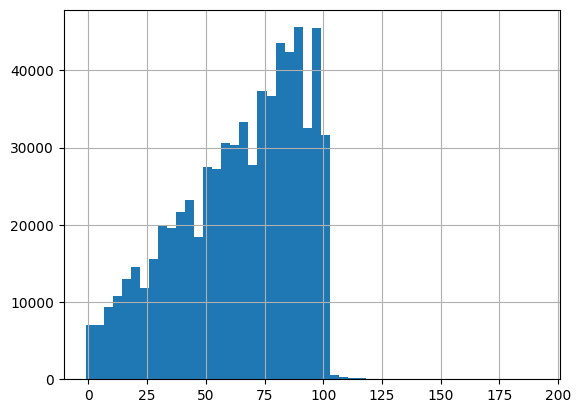

In [66]:
df[df["YIELD"]<200]["YIELD"].hist(bins=50)

In [67]:
train = pd.read_csv("/home/acf15718oa/ReactionT5_neword/data/C_N_yield/MFF_Test1/train.csv")
test = pd.read_csv("/home/acf15718oa/ReactionT5_neword/data/C_N_yield/MFF_Test1/test.csv")

df = pd.concat([train, test]).reset_index(drop=True)
df

,REACTANT,REAGENT,PRODUCT,YIELD
0,FC(F)(F)c1ccc(Cl)cc1.Cc1ccc(N)cc1,CC(C)c1cc(C(C)C)c(-c2ccccc2P(C2CCCCC2)(C2CCCCC...,Cc1ccc(Nc2ccc(C(F)(F)F)cc2)cc1,3.606677
1,FC(F)(F)c1ccc(Br)cc1.Cc1ccc(N)cc1,CC(C)c1cc(C(C)C)c(-c2ccccc2P(C2CCCCC2)(C2CCCCC...,Cc1ccc(Nc2ccc(C(F)(F)F)cc2)cc1,35.078662
2,FC(F)(F)c1ccc(I)cc1.Cc1ccc(N)cc1,CC(C)c1cc(C(C)C)c(-c2ccccc2P(C2CCCCC2)(C2CCCCC...,Cc1ccc(Nc2ccc(C(F)(F)F)cc2)cc1,43.318146
3,COc1ccc(Cl)cc1.Cc1ccc(N)cc1,CC(C)c1cc(C(C)C)c(-c2ccccc2P(C2CCCCC2)(C2CCCCC...,COc1ccc(Nc2ccc(C)cc2)cc1,0.000000
4,COc1ccc(Br)cc1.Cc1ccc(N)cc1,CC(C)c1cc(C(C)C)c(-c2ccccc2P(C2CCCCC2)(C2CCCCC...,COc1ccc(Nc2ccc(C)cc2)cc1,29.298178
...,...,...,...,...
3950,Brc1ccccn1.Cc1ccc(N)cc1,COc1ccc(OC)c(P(C23CC4CC(CC(C4)C2)C3)(C23CC4CC(...,Cc1ccc(Nc2ccccn2)cc1,57.426670
3951,Ic1ccccn1.Cc1ccc(N)cc1,COc1ccc(OC)c(P(C23CC4CC(CC(C4)C2)C3)(C23CC4CC(...,Cc1ccc(Nc2ccccn2)cc1,86.233157
3952,Clc1cccnc1.Cc1ccc(N)cc1,COc1ccc(OC)c(P(C23CC4CC(CC(C4)C2)C3)(C23CC4CC(...,Cc1ccc(Nc2cccnc2)cc1,1.440081
3953,Brc1cccnc1.Cc1ccc(N)cc1,COc1ccc(OC)c(P(C23CC4CC(CC(C4)C2)C3)(C23CC4CC(...,Cc1ccc(Nc2cccnc2)cc1,43.538365
